# Problem Statement

__What is best regression model based on the Ames Housing Dataset for predicting house prices?__

We will be using RMSE as are main score variable and linear regression as are model.
Sussess will be evaluated useing RMSE.



In [2]:

# - Is it clear who cares about this or why this is important to investigate?
# - Does the student consider the audience and the primary and secondary stakeholders?

1.0 Import Libraries

In [100]:
import numpy as np
import scipy.stats as stats
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as sk
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

from sklearn.linear_model import LinearRegression, Lasso, LassoCV, RidgeCV
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.metrics import mean_squared_error


No scientification notation for best practices.

In [4]:
pd.options.display.float_format = '{:.4f}'.format # no sci notation
pd.set_option('display.max_columns', None)

1.1 Read Data

In [5]:
df= pd.read_csv('./datasets/train.csv')

In [6]:
df_test= pd.read_csv('./datasets/test.csv')

In [7]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878 entries, 0 to 877
Data columns (total 80 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Id               878 non-null    int64  
 1   PID              878 non-null    int64  
 2   MS SubClass      878 non-null    int64  
 3   MS Zoning        878 non-null    object 
 4   Lot Frontage     718 non-null    float64
 5   Lot Area         878 non-null    int64  
 6   Street           878 non-null    object 
 7   Alley            58 non-null     object 
 8   Lot Shape        878 non-null    object 
 9   Land Contour     878 non-null    object 
 10  Utilities        878 non-null    object 
 11  Lot Config       878 non-null    object 
 12  Land Slope       878 non-null    object 
 13  Neighborhood     878 non-null    object 
 14  Condition 1      878 non-null    object 
 15  Condition 2      878 non-null    object 
 16  Bldg Type        878 non-null    object 
 17  House Style     

1.2 Check for Null Values

In [8]:
df.describe()

,Id,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,BsmtFin SF 1,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,TotRms AbvGrd,Fireplaces,Garage Yr Blt,Garage Cars,Garage Area,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
count,2051.0000,2051.0000,2051.0000,1721.0000,2051.0000,2051.0000,2051.0000,2051.0000,2051.0000,2029.0000,2050.0000,2050.0000,2050.0000,2050.0000,2051.0000,2051.0000,2051.0000,2051.0000,2049.0000,2049.0000,2051.0000,2051.0000,2051.0000,2051.0000,2051.0000,2051.0000,1937.0000,2050.0000,2050.0000,2051.0000,2051.0000,2051.0000,2051.0000,2051.0000,2051.0000,2051.0000,2051.0000,2051.0000,2051.0000
mean,1474.0336,713590006.0917,57.0088,69.0552,10065.2082,6.1121,5.5622,1971.7089,1984.1902,99.6959,442.3005,47.9590,567.7283,1057.9878,1164.4881,329.3291,5.5129,1499.3301,0.4275,0.0634,1.5773,0.3710,2.8435,1.0429,6.4359,0.5909,1978.7078,1.7766,473.6717,93.8337,47.5568,22.5719,2.5914,16.5115,2.3979,51.5744,6.2199,2007.7757,181469.7016
std,843.9808,188691837.8853,42.8242,23.2607,6742.4889,1.4263,1.1045,30.1779,21.0363,174.9631,461.2041,165.0009,444.9548,449.4107,396.4469,425.6710,51.0689,500.4478,0.5227,0.2517,0.5493,0.5010,0.8266,0.2098,1.5602,0.6385,25.4411,0.7645,215.9346,128.5494,66.7472,59.8451,25.2296,57.3742,37.7826,573.3940,2.7447,1.3120,79258.6594
min,1.0000,526301100.0000,20.0000,21.0000,1300.0000,1.0000,1.0000,1872.0000,1950.0000,0.0000,0.0000,0.0000,0.0000,0.0000,334.0000,0.0000,0.0000,334.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,2.0000,0.0000,1895.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,2006.0000,12789.0000
25%,753.5000,528458140.0000,20.0000,58.0000,7500.0000,5.0000,5.0000,1953.5000,1964.5000,0.0000,0.0000,0.0000,220.0000,793.0000,879.5000,0.0000,0.0000,1129.0000,0.0000,0.0000,1.0000,0.0000,2.0000,1.0000,5.0000,0.0000,1961.0000,1.0000,319.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,4.0000,2007.0000,129825.0000
50%,1486.0000,535453200.0000,50.0000,68.0000,9430.0000,6.0000,5.0000,1974.0000,1993.0000,0.0000,368.0000,0.0000,474.5000,994.5000,1093.0000,0.0000,0.0000,1444.0000,0.0000,0.0000,2.0000,0.0000,3.0000,1.0000,6.0000,1.0000,1980.0000,2.0000,480.0000,0.0000,27.0000,0.0000,0.0000,0.0000,0.0000,0.0000,6.0000,2008.0000,162500.0000
75%,2198.0000,907180080.0000,70.0000,80.0000,11513.5000,7.0000,6.0000,2001.0000,2004.0000,161.0000,733.7500,0.0000,811.0000,1318.7500,1405.0000,692.5000,0.0000,1728.5000,1.0000,0.0000,2.0000,1.0000,3.0000,1.0000,7.0000,1.0000,2002.0000,2.0000,576.0000,168.0000,70.0000,0.0000,0.0000,0.0000,0.0000,0.0000,8.0000,2009.0000,214000.0000
max,2930.0000,924152030.0000,190.0000,313.0000,159000.0000,10.0000,9.0000,2010.0000,2010.0000,1600.0000,5644.0000,1474.0000,2336.0000,6110.0000,5095.0000,1862.0000,1064.0000,5642.0000,3.0000,2.0000,4.0000,2.0000,8.0000,3.0000,15.0000,4.0000,2207.0000,5.0000,1418.0000,1424.0000,547.0000,432.0000,508.0000,490.0000,800.0000,17000.0000,12.0000,2010.0000,611657.0000


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2051 entries, 0 to 2050
Data columns (total 81 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Id               2051 non-null   int64  
 1   PID              2051 non-null   int64  
 2   MS SubClass      2051 non-null   int64  
 3   MS Zoning        2051 non-null   object 
 4   Lot Frontage     1721 non-null   float64
 5   Lot Area         2051 non-null   int64  
 6   Street           2051 non-null   object 
 7   Alley            140 non-null    object 
 8   Lot Shape        2051 non-null   object 
 9   Land Contour     2051 non-null   object 
 10  Utilities        2051 non-null   object 
 11  Lot Config       2051 non-null   object 
 12  Land Slope       2051 non-null   object 
 13  Neighborhood     2051 non-null   object 
 14  Condition 1      2051 non-null   object 
 15  Condition 2      2051 non-null   object 
 16  Bldg Type        2051 non-null   object 
 17  House Style   

Data Cleaning steps

1.Handling Missing Values:

Remove the rows/columns with missing values or impute them.
For categorical data, we often fill missing values with the mode (the most frequent category) of the column, or we can use a placeholder like "Unknown".
For numerical data, we can use measures like the mean or median to fill in missing values, or use more sophisticated methods like model-based imputation.
Converting Data Types:

May need to convert some object types to categorical if they represent categories.
Some numerical types representing categories may also need to be converted to the categorical type.
Handling Duplicates:

We need to identify and remove duplicate rows if any.

In [10]:
# **Data Cleaning and EDA**

# - Are outliers identified and addressed?
# - Are appropriate summary statistics provided?
# - Are steps taken during data cleaning and EDA framed appropriately?
# - Does the student address whether or not they are likely to be able to answer their problem statement with the provided data given what they've discovered during EDA?

Showing missing values and thier percentages.

In [11]:
missing_val = df.isnull().sum()
missing_val = missing_val[missing_val > 0].sort_values(ascending=False)
missing_val_per = (missing_val / len(df)) * 100
                                
missing_df = pd.DataFrame({'Missing Values': missing_val, 'Percentage': missing_val_per})# Creating a DF to display the missing values and their corresponding percentages
missing_df

,Missing Values,Percentage
Pool QC,2042,99.5612
Misc Feature,1986,96.8308
Alley,1911,93.1741
Fence,1651,80.4973
Fireplace Qu,1000,48.7567
Lot Frontage,330,16.0897
Garage Yr Blt,114,5.5583
Garage Cond,114,5.5583
Garage Qual,114,5.5583
Garage Finish,114,5.5583


In [12]:
print(f"Shape: {df.shape}")
df.head()

Shape: (2051, 81)


,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
0,109,533352170,60,RL,NaN,13517,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Sawyer,RRAe,Norm,1Fam,2Story,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0000,Gd,TA,CBlock,TA,TA,No,GLQ,533.0000,Unf,0.0000,192.0000,725.0000,GasA,Ex,Y,SBrkr,725,754,0,1479,0.0000,0.0000,2,1,3,1,Gd,6,Typ,0,NaN,Attchd,1976.0000,RFn,2.0000,475.0000,TA,TA,Y,0,44,0,0,0,0,NaN,NaN,NaN,0,3,2010,WD,130500
1,544,531379050,60,RL,43.0000,11492,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,SawyerW,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,VinylSd,VinylSd,BrkFace,132.0000,Gd,TA,PConc,Gd,TA,No,GLQ,637.0000,Unf,0.0000,276.0000,913.0000,GasA,Ex,Y,SBrkr,913,1209,0,2122,1.0000,0.0000,2,1,4,1,Gd,8,Typ,1,TA,Attchd,1997.0000,RFn,2.0000,559.0000,TA,TA,Y,0,74,0,0,0,0,NaN,NaN,NaN,0,4,2009,WD,220000
2,153,535304180,20,RL,68.0000,7922,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1953,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0000,TA,Gd,CBlock,TA,TA,No,GLQ,731.0000,Unf,0.0000,326.0000,1057.0000,GasA,TA,Y,SBrkr,1057,0,0,1057,1.0000,0.0000,1,0,3,1,Gd,5,Typ,0,NaN,Detchd,1953.0000,Unf,1.0000,246.0000,TA,TA,Y,0,52,0,0,0,0,NaN,NaN,NaN,0,1,2010,WD,109000
3,318,916386060,60,RL,73.0000,9802,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,2Story,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0000,TA,TA,PConc,Gd,TA,No,Unf,0.0000,Unf,0.0000,384.0000,384.0000,GasA,Gd,Y,SBrkr,744,700,0,1444,0.0000,0.0000,2,1,3,1,TA,7,Typ,0,NaN,BuiltIn,2007.0000,Fin,2.0000,400.0000,TA,TA,Y,100,0,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,174000
4,255,906425045,50,RL,82.0000,14235,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1.5Fin,6,8,1900,1993,Gable,CompShg,Wd Sdng,Plywood,None,0.0000,TA,TA,PConc,Fa,Gd,No,Unf,0.0000,Unf,0.0000,676.0000,676.0000,GasA,TA,Y,SBrkr,831,614,0,1445,0.0000,0.0000,2,0,3,1,TA,6,Typ,0,NaN,Detchd,1957.0000,Unf,2.0000,484.0000,TA,TA,N,0,59,0,0,0,0,NaN,NaN,NaN,0,3,2010,WD,138500


 Before droping Colums and values; making a copy of the original

In [13]:
df2= df.copy()

Droping Colums with more then 80% NaN values

In [14]:
df2.drop([ "Pool QC", "Misc Feature","Alley", 'Fence' ], axis=1, inplace=True)

Ordinal mapping for data description

In [15]:
#Taken from data description
# FireplaceQu: Fireplace quality
# Ex Excellent - Exceptional Masonry Fireplace
# Gd Good - Masonry Fireplace in main level
# TA Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
# Fa Fair - Prefabricated Fireplace in basement
# Po Poor - Ben Franklin Stove
# NA No Fireplace

In [16]:
ordinal_mapping = {'NA':0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5}

In [17]:
df2['Fireplace Qu'].isnull().sum()/len(df2['Fireplace Qu']) * 100

48.75670404680644

Modrate NaN value features should be imputed

In [18]:
#Waiting to see what Gd, TA and NaN mean here
#df2['Fireplace Qu'].fillna(df2['Fireplace Qu'].median(), inplace=True)
df2['Fireplace Qu'].fillna('NA', inplace=True)

For the column "Lot Frontage" a meadian or a mode can be used. However, a lot on a same street or area would have aproximattly the same lot frontage. Next few lines of code will help deside what value in appropriate to filled inplace of non-values.

In [19]:
df2['Lot Frontage'].median()

68.0

In [20]:
df2['Lot Frontage'].mean()

69.05520046484602

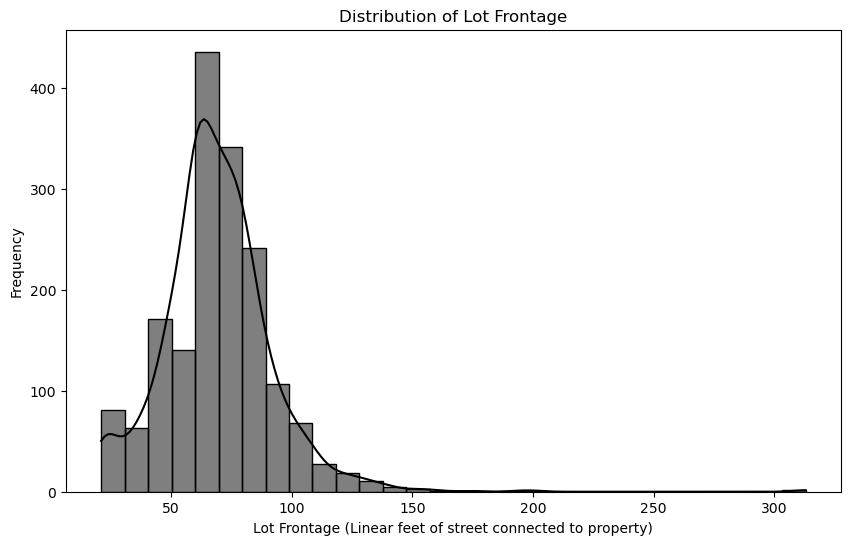

In [21]:

plt.figure(figsize=(10, 6))
sns.histplot(df2['Lot Frontage'], kde=True, bins=30, color="black", line_kws={"color": "gray"})
plt.title('Distribution of Lot Frontage')
plt.xlabel('Lot Frontage (Linear feet of street connected to property)')
plt.ylabel('Frequency')
plt.show()

The Lot Frontage is normally distributed. Therefore, a mean valuse would be appropriate also beacuse only 16.08% of the column valuses are null.

In [22]:
df2['Lot Frontage'].fillna(df2['Lot Frontage'].mean(), inplace=True)

For 'Garage Cond'	

In [23]:
# GarageCond: Garage condition
# Ex Excellent
# Gd Good
# TA Typical/Average
# Fa Fair
# Po Poor
# NA No Garage

df2['Garage Cond'].unique()

array(['TA', 'Fa', nan, 'Po', 'Gd', 'Ex'], dtype=object)

The data description indicateds 'NA' for No Garage. However, when .unique() is called on the column there is no "NA" value. Hence, the nan value can be substituted with "NA' indicating no Garage. Assuming that there is a parking lot for resident parking.

In [24]:
df2['Garage Cond'].fillna('NA', inplace=True)

In [25]:
df2['Garage Cond'].describe()

count     2051
unique       6
top         TA
freq      1868
Name: Garage Cond, dtype: object

In [26]:
df2['Garage Qual'].unique()

array(['TA', 'Fa', nan, 'Gd', 'Ex', 'Po'], dtype=object)

In [27]:
df2['Garage Qual'].fillna('NA', inplace=True)

In [28]:
df2['Garage Finish'].unique()

array(['RFn', 'Unf', 'Fin', nan], dtype=object)

In [29]:
df2['Garage Finish'].fillna('NA', inplace=True)

In [30]:
df2['Garage Yr Blt'].unique()

array([1976., 1997., 1953., 2007., 1957., 1966., 2005., 1959., 1952.,
       1969., 1971., 1900., 2000., 2004., 1916., 1963., 1977., 2009.,
       1968., 1992., 1955., 1961., 1973., 1937.,   nan, 2003., 1981.,
       1931., 1995., 1958., 1965., 2006., 1978., 1954., 1935., 1951.,
       1996., 1999., 1920., 1930., 1924., 1960., 1949., 1986., 1956.,
       1994., 1979., 1964., 2001., 1972., 1939., 1962., 1927., 1948.,
       1967., 1993., 2010., 1915., 1987., 1970., 1988., 1982., 1941.,
       1984., 1942., 1950., 2002., 1975., 2008., 1974., 1998., 1918.,
       1938., 1985., 1923., 1980., 1991., 1946., 1940., 1990., 1896.,
       1983., 1914., 1945., 1921., 1925., 1926., 1936., 1932., 1947.,
       1929., 1910., 1917., 1922., 1934., 1989., 1928., 2207., 1933.,
       1895., 1919.])

In [31]:
#df2['Garage Yr Blt'] = pd.to_numeric(df2['Garage Yr Blt'], errors='coerce') # Convert to numeric
#df2['Garage Yr Blt'].astype(int)

In [32]:
df2['Garage Yr Blt'].fillna(int(df2['Garage Yr Blt'].mean()), inplace=True) # instead of filling it with 0, a mean a much better option because these are all years.

In [33]:
df2['Garage Yr Blt'].unique()

array([1976., 1997., 1953., 2007., 1957., 1966., 2005., 1959., 1952.,
       1969., 1971., 1900., 2000., 2004., 1916., 1963., 1977., 2009.,
       1968., 1992., 1955., 1961., 1973., 1937., 1978., 2003., 1981.,
       1931., 1995., 1958., 1965., 2006., 1954., 1935., 1951., 1996.,
       1999., 1920., 1930., 1924., 1960., 1949., 1986., 1956., 1994.,
       1979., 1964., 2001., 1972., 1939., 1962., 1927., 1948., 1967.,
       1993., 2010., 1915., 1987., 1970., 1988., 1982., 1941., 1984.,
       1942., 1950., 2002., 1975., 2008., 1974., 1998., 1918., 1938.,
       1985., 1923., 1980., 1991., 1946., 1940., 1990., 1896., 1983.,
       1914., 1945., 1921., 1925., 1926., 1936., 1932., 1947., 1929.,
       1910., 1917., 1922., 1934., 1989., 1928., 2207., 1933., 1895.,
       1919.])

In [34]:
df2['Garage Type'].unique()

array(['Attchd', 'Detchd', 'BuiltIn', 'Basment', nan, '2Types', 'CarPort'],
      dtype=object)

In [35]:
df2['Garage Type'].fillna('NA', inplace=True)

All other null values can be droped as they are less then 2% of their respective columns.

To verify missing values

In [36]:
df2.dropna(inplace= True) 
missing_val = df2.isnull().sum()
missing_val = missing_val[missing_val > 0].sort_values(ascending=False)
missing_val_per = (missing_val / len(df2)) * 100
                                
missing_df = pd.DataFrame({'Missing Values': missing_val, 'Percentage': missing_val_per})# Creating a DF to display the missing values and their corresponding percentages
missing_df

,Missing Values,Percentage


Successfully removed all Null valuse from the *entire* dataset.

For EDA, I will start with descriptive statistics

Setting ID as the index

In [37]:
df2.set_index("Id", inplace=True)

In [38]:
df2.sort_index(ascending=True, inplace=True)

In [39]:
df2.head()

,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,526301100,20,RL,141.0000,31770,Pave,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1960,1960,Hip,CompShg,BrkFace,Plywood,Stone,112.0000,TA,TA,CBlock,TA,Gd,Gd,BLQ,639.0000,Unf,0.0000,441.0000,1080.0000,GasA,Fa,Y,SBrkr,1656,0,0,1656,1.0000,0.0000,1,0,3,1,TA,7,Typ,2,Gd,Attchd,1960.0000,Fin,2.0000,528.0000,TA,TA,P,210,62,0,0,0,0,0,5,2010,WD,215000
3,526351010,20,RL,81.0000,14267,Pave,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0000,TA,TA,CBlock,TA,TA,No,ALQ,923.0000,Unf,0.0000,406.0000,1329.0000,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0000,0.0000,1,1,3,1,Gd,6,Typ,0,NA,Attchd,1958.0000,Unf,1.0000,312.0000,TA,TA,Y,393,36,0,0,0,0,12500,6,2010,WD,172000
5,527105010,60,RL,74.0000,13830,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0000,TA,TA,PConc,Gd,TA,No,GLQ,791.0000,Unf,0.0000,137.0000,928.0000,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0000,0.0000,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0000,Fin,2.0000,482.0000,TA,TA,Y,212,34,0,0,0,0,0,3,2010,WD,189900
8,527145080,120,RL,43.0000,5005,Pave,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0000,Gd,TA,PConc,Gd,TA,No,ALQ,263.0000,Unf,0.0000,1017.0000,1280.0000,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0000,0.0000,2,0,2,1,Gd,5,Typ,0,NA,Attchd,1992.0000,RFn,2.0000,506.0000,TA,TA,Y,0,82,0,0,144,0,0,1,2010,WD,191500
9,527146030,120,RL,39.0000,5389,Pave,IR1,Lvl,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1995,1996,Gable,CompShg,CemntBd,CmentBd,None,0.0000,Gd,TA,PConc,Gd,TA,No,GLQ,1180.0000,Unf,0.0000,415.0000,1595.0000,GasA,Ex,Y,SBrkr,1616,0,0,1616,1.0000,0.0000,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1995.0000,RFn,2.0000,608.0000,TA,TA,Y,237,152,0,0,0,0,0,3,2010,WD,236500


Using .describe().This will provide you with the count, mean, standard deviation, minimum, 25th percentile, median, 75th percentile, and maximum for each numerical column.

In [40]:
df2.describe()

,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,BsmtFin SF 1,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,TotRms AbvGrd,Fireplaces,Garage Yr Blt,Garage Cars,Garage Area,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
count,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000,1969.0000
mean,712565924.1590,57.0797,68.8737,10005.6196,6.1549,5.5835,1971.8146,1984.4347,101.7501,454.2351,49.5378,580.4566,1084.2296,1164.3271,331.9279,5.6115,1501.8664,0.4393,0.0660,1.5708,0.3753,2.8487,1.0330,6.4358,0.5998,1978.6140,1.7816,475.1407,95.9629,47.8690,22.2956,2.6993,16.8649,2.2128,51.3860,6.2123,2007.7760,182892.8619
std,188672900.7522,43.0090,21.2418,6710.2258,1.3859,1.1054,30.2278,20.8607,176.4330,461.0140,167.7054,439.5154,417.2030,392.5702,425.9363,51.9046,498.9140,0.5253,0.2564,0.5468,0.5008,0.8149,0.1870,1.5539,0.6402,24.2599,0.7605,215.2032,129.5931,66.2917,59.6988,25.7442,57.7971,36.4442,579.7202,2.7476,1.3133,78938.3343
min,526301100.0000,20.0000,21.0000,1300.0000,1.0000,1.0000,1872.0000,1950.0000,0.0000,0.0000,0.0000,0.0000,160.0000,438.0000,0.0000,0.0000,438.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.0000,0.0000,1895.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,2006.0000,12789.0000
25%,528456240.0000,20.0000,60.0000,7500.0000,5.0000,5.0000,1954.0000,1965.0000,0.0000,0.0000,0.0000,240.0000,811.0000,879.0000,0.0000,0.0000,1134.0000,0.0000,0.0000,1.0000,0.0000,2.0000,1.0000,5.0000,0.0000,1962.0000,1.0000,320.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,4.0000,2007.0000,130000.0000
50%,535452090.0000,50.0000,69.0552,9405.0000,6.0000,5.0000,1975.0000,1993.0000,0.0000,384.0000,0.0000,484.0000,1008.0000,1092.0000,0.0000,0.0000,1445.0000,0.0000,0.0000,2.0000,0.0000,3.0000,1.0000,6.0000,1.0000,1978.0000,2.0000,480.0000,0.0000,28.0000,0.0000,0.0000,0.0000,0.0000,0.0000,6.0000,2008.0000,163500.0000
75%,907175100.0000,70.0000,78.0000,11492.0000,7.0000,6.0000,2001.0000,2004.0000,164.0000,741.0000,0.0000,816.0000,1329.0000,1405.0000,694.0000,0.0000,1728.0000,1.0000,0.0000,2.0000,1.0000,3.0000,1.0000,7.0000,1.0000,2001.0000,2.0000,576.0000,168.0000,70.0000,0.0000,0.0000,0.0000,0.0000,0.0000,8.0000,2009.0000,214900.0000
max,924152030.0000,190.0000,313.0000,159000.0000,10.0000,9.0000,2010.0000,2010.0000,1600.0000,5644.0000,1474.0000,2336.0000,6110.0000,5095.0000,1862.0000,1064.0000,5642.0000,3.0000,2.0000,4.0000,2.0000,8.0000,3.0000,15.0000,4.0000,2010.0000,5.0000,1418.0000,1424.0000,547.0000,432.0000,508.0000,490.0000,800.0000,17000.0000,12.0000,2010.0000,611657.0000


In [41]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1969 entries, 1 to 2930
Data columns (total 76 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   PID              1969 non-null   int64  
 1   MS SubClass      1969 non-null   int64  
 2   MS Zoning        1969 non-null   object 
 3   Lot Frontage     1969 non-null   float64
 4   Lot Area         1969 non-null   int64  
 5   Street           1969 non-null   object 
 6   Lot Shape        1969 non-null   object 
 7   Land Contour     1969 non-null   object 
 8   Utilities        1969 non-null   object 
 9   Lot Config       1969 non-null   object 
 10  Land Slope       1969 non-null   object 
 11  Neighborhood     1969 non-null   object 
 12  Condition 1      1969 non-null   object 
 13  Condition 2      1969 non-null   object 
 14  Bldg Type        1969 non-null   object 
 15  House Style      1969 non-null   object 
 16  Overall Qual     1969 non-null   int64  
 17  Overall Cond  

In [42]:
non_numerical_columns = df2.select_dtypes(include=['object']).columns
non_numerical_columns

Index(['MS Zoning', 'Street', 'Lot Shape', 'Land Contour', 'Utilities',
       'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1',
       'Condition 2', 'Bldg Type', 'House Style', 'Roof Style', 'Roof Matl',
       'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Exter Qual',
       'Exter Cond', 'Foundation', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure',
       'BsmtFin Type 1', 'BsmtFin Type 2', 'Heating', 'Heating QC',
       'Central Air', 'Electrical', 'Kitchen Qual', 'Functional',
       'Fireplace Qu', 'Garage Type', 'Garage Finish', 'Garage Qual',
       'Garage Cond', 'Paved Drive', 'Sale Type'],
      dtype='object')

### Baseline Correlation

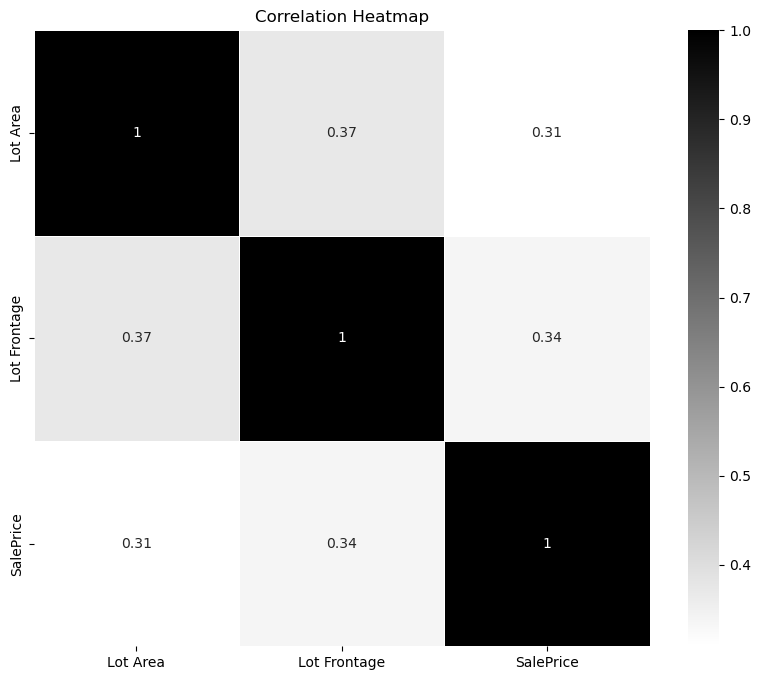

In [43]:
correlation_matrix = df2[['Lot Area', 'Lot Frontage', 'SalePrice']].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="binary", square=True, linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()


## EDA Continued

Ploting correlation of non-categorical features with sales price

In [44]:
numeric_column_corr = df2.select_dtypes(include=['int64', 'float64']).corr()[['SalePrice']].sort_values('SalePrice', ascending=False)
numeric_column_corr

,SalePrice
SalePrice,1.0000
Overall Qual,0.7976
Gr Liv Area,0.7009
Garage Cars,0.6515
Garage Area,0.6510
1st Flr SF,0.6301
Total Bsmt SF,0.6293
Year Built,0.5678
Full Bath,0.5480
Year Remod/Add,0.5415


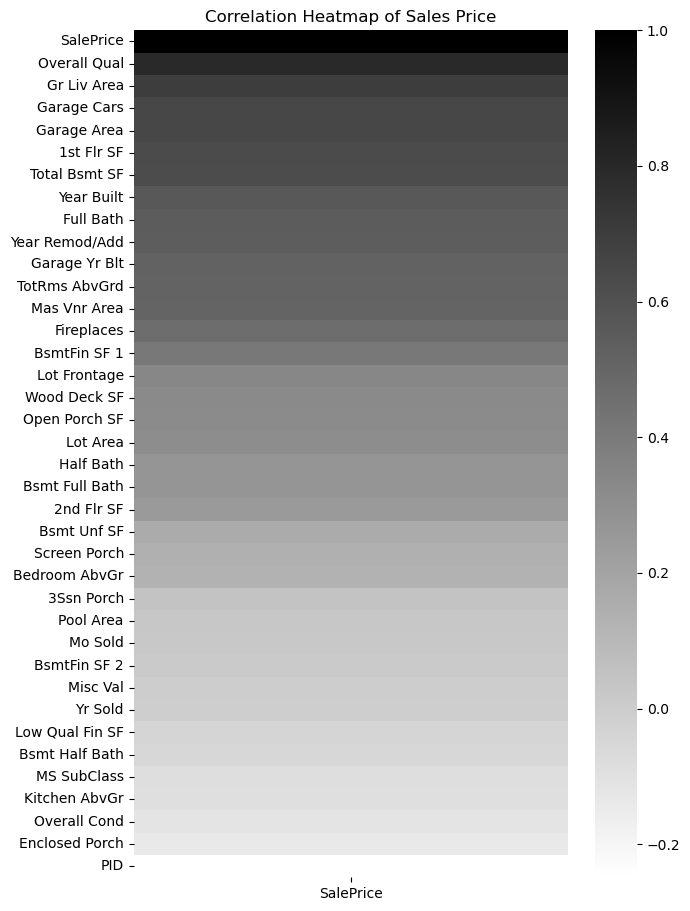

In [45]:
plt.figure(figsize=(7, 11))
sns.heatmap(numeric_column_corr, cmap="binary")  
plt.title('Correlation Heatmap of Sales Price')
plt.show()

## A baseline model of highest correlated features

We will choose the top 10 non-categorical (numeric) features with highest correlation to Sales Price to train a baseline model

In [46]:

X = df2[numeric_column_corr.index.values[1:11]]
y = df2['SalePrice']
print(f"X shape {X.shape}")
print(f"y shape {y.shape}")

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Instantiate
model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

# metrics
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

f"rmse = {rmse}", f"r2 = {r2}"

X shape (1969, 10)
y shape (1969,)


('rmse = 40412.86100369427', 'r2 = 0.7626541968542401')

With Cross validation

In [47]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = LinearRegression()
mse_scores = []
r2_scores = []
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse_scores.append(mean_squared_error(y_test, y_pred, squared=False))
    r2_scores.append(r2_score(y_test, y_pred))

f"mean rmse = {np.mean(mse_scores)}", f" mean r2 = {np.mean(r2_scores)}"

('mean rmse = 36949.87866445592', ' mean r2 = 0.779848655366105')

What about adding regularization?

In [48]:

# Base line predictions
X = df2[numeric_column_corr.index.values[1:11]]
y = df2['SalePrice']
print(f"X shape {X.shape}")
print(f"y shape {y.shape}")

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Instantiate
model = LassoCV(cv=5)  # 5-fold cross-validation
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

# metrics
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

f"rmse = {rmse}", f"r2 = {r2}"

X shape (1969, 10)
y shape (1969,)


('rmse = 44359.00408473574', 'r2 = 0.7140395731173013')

## A basline model with all the numeric features?

In [49]:
X = df2.select_dtypes(include=['int64', 'float64']).drop('SalePrice', axis=1)
y = df2['SalePrice']
print(f"X shape {X.shape}")
print(f"y shape {y.shape}")

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Instantiate
model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

# metrics
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

f"rmse = {rmse}", f"r2 = {r2}"



X shape (1969, 37)
y shape (1969,)


('rmse = 38337.59165478559', 'r2 = 0.7864045402331978')

With Cross validation

In [50]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = LinearRegression()
mse_scores = []
r2_scores = []
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse_scores.append(mean_squared_error(y_test, y_pred, squared=False))
    r2_scores.append(r2_score(y_test, y_pred))

f"mean rmse = {np.mean(mse_scores)}", f" mean r2 = {np.mean(r2_scores)}"

('mean rmse = 35642.85184537606', ' mean r2 = 0.791738446278189')

and with regularization

In [51]:
X = df2.select_dtypes(include=['int64', 'float64']).drop('SalePrice', axis=1)
y = df2['SalePrice']

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Instantiate
model = LassoCV(cv=5)  # 5-fold cross-validation
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

# metrics
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

f"rmse = {rmse}", f"r2 = {r2}"

('rmse = 80240.8060669871', 'r2 = 0.06430797487379125')

A discovery: LassoCV's RMSE and R2 for only numeric features gives us the most *undesirable* result.

In [52]:
model.coef_

array([-0.00010052, -0.        ,  0.        ,  0.        ,  0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        ,  0.        ,  0.        , -0.        ,  0.        ,
        0.        ,  0.        , -0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        ,  0.        ,  0.        ,  0.        , -0.        ,
        0.        , -0.        ])

Upon research, this phenomenon is due to the fact that Lasso regression introduces L1 regularization, which can force some coefficients to be exactly zero. 

### Solution: Scaling the features before modeling.

In [53]:


X = df2.select_dtypes(include=['int64', 'float64']).drop('SalePrice', axis=1)
y = df2['SalePrice']

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Scaling the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Instantiate
model = LassoCV(cv=5)  # 5-fold cross-validation
model.fit(X_train_scaled, y_train)

y_pred = model.predict(X_test_scaled)

# metrics
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

f"rmse = {rmse}", f"r2 = {r2}"


('rmse = 37934.24414094182', 'r2 = 0.7908753474821981')

## A basline model with all the numeric and dummied features?

In [54]:
set(df2.dtypes.values)

{dtype('int64'), dtype('float64'), dtype('O')}

In [55]:
categorical_df = df2.select_dtypes(include=['object'])
categorical_df

,MS Zoning,Street,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin Type 2,Heating,Heating QC,Central Air,Electrical,Kitchen Qual,Functional,Fireplace Qu,Garage Type,Garage Finish,Garage Qual,Garage Cond,Paved Drive,Sale Type
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,Hip,CompShg,BrkFace,Plywood,Stone,TA,TA,CBlock,TA,Gd,Gd,BLQ,Unf,GasA,Fa,Y,SBrkr,TA,Typ,Gd,Attchd,Fin,TA,TA,P,WD
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,TA,TA,CBlock,TA,TA,No,ALQ,Unf,GasA,TA,Y,SBrkr,Gd,Typ,NA,Attchd,Unf,TA,TA,Y,WD
5,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Gd,Y,SBrkr,TA,Typ,TA,Attchd,Fin,TA,TA,Y,WD
8,RL,Pave,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,Gable,CompShg,HdBoard,HdBoard,None,Gd,TA,PConc,Gd,TA,No,ALQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NA,Attchd,RFn,TA,TA,Y,WD
9,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,Gable,CompShg,CemntBd,CmentBd,None,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2924,RL,Pave,Reg,Low,AllPub,Inside,Mod,Mitchel,Norm,Norm,1Fam,1Story,Gable,CompShg,BrkFace,BrkFace,None,TA,TA,CBlock,TA,TA,No,ALQ,Unf,GasA,Fa,Y,SBrkr,TA,Typ,Gd,Attchd,RFn,TA,TA,P,WD
2926,RL,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,Mitchel,Norm,Norm,1Fam,SLvl,Gable,CompShg,HdBoard,HdBoard,None,TA,TA,CBlock,TA,TA,Av,GLQ,Unf,GasA,TA,Y,SBrkr,TA,Typ,NA,Detchd,Unf,TA,TA,Y,WD
2927,RL,Pave,IR1,Low,AllPub,Inside,Mod,Mitchel,Norm,Norm,1Fam,1Story,Gable,CompShg,HdBoard,HdBoard,None,TA,TA,CBlock,Gd,TA,Av,BLQ,ALQ,GasA,TA,Y,SBrkr,TA,Typ,NA,Attchd,Unf,TA,TA,Y,WD


In [56]:
#categorical_df = pd.get_dummies(categorical_df, drop_first=True)
# # Defining the ordinal mapping and columns list 
ordinal_mapping = {'NA':0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5}

for col in categorical_df:
    categorical_df[col] = categorical_df[col].replace(ordinal_mapping)

# # categorical_df
categorical_df = pd.get_dummies(categorical_df, drop_first=True)
categorical_df

,Exter Qual,Exter Cond,Bsmt Qual,Bsmt Cond,Heating QC,Kitchen Qual,Fireplace Qu,Garage Qual,Garage Cond,MS Zoning_FV,MS Zoning_RH,MS Zoning_RL,MS Zoning_RM,Street_Pave,Lot Shape_IR2,Lot Shape_IR3,Lot Shape_Reg,Land Contour_HLS,Land Contour_Low,Land Contour_Lvl,Utilities_NoSeWa,Lot Config_CulDSac,Lot Config_FR2,Lot Config_FR3,Lot Config_Inside,Land Slope_Mod,Land Slope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition 1_Feedr,Condition 1_Norm,Condition 1_PosA,Condition 1_PosN,Condition 1_RRAe,Condition 1_RRAn,Condition 1_RRNe,Condition 1_RRNn,Condition 2_Feedr,Condition 2_Norm,Condition 2_PosA,Condition 2_PosN,Condition 2_RRAe,Condition 2_RRAn,Condition 2_RRNn,Bldg Type_2fmCon,Bldg Type_Duplex,Bldg Type_Twnhs,Bldg Type_TwnhsE,House Style_1.5Unf,House Style_1Story,House Style_2.5Fin,House Style_2.5Unf,House Style_2Story,House Style_SFoyer,House Style_SLvl,Roof Style_Gable,Roof Style_Gambrel,Roof Style_Hip,Roof Style_Mansard,Roof Style_Shed,Roof Matl_CompShg,Roof Matl_Membran,Roof Matl_Tar&Grv,Roof Matl_WdShake,Roof Matl_WdShngl,Exterior 1st_AsphShn,Exterior 1st_BrkComm,Exterior 1st_BrkFace,Exterior 1st_CBlock,Exterior 1st_CemntBd,Exterior 1st_HdBoard,Exterior 1st_ImStucc,Exterior 1st_MetalSd,Exterior 1st_Plywood,Exterior 1st_Stone,Exterior 1st_Stucco,Exterior 1st_VinylSd,Exterior 1st_Wd Sdng,Exterior 1st_WdShing,Exterior 2nd_AsphShn,Exterior 2nd_Brk Cmn,Exterior 2nd_BrkFace,Exterior 2nd_CBlock,Exterior 2nd_CmentBd,Exterior 2nd_HdBoard,Exterior 2nd_ImStucc,Exterior 2nd_MetalSd,Exterior 2nd_Plywood,Exterior 2nd_Stone,Exterior 2nd_Stucco,Exterior 2nd_VinylSd,Exterior 2nd_Wd Sdng,Exterior 2nd_Wd Shng,Mas Vnr Type_BrkFace,Mas Vnr Type_None,Mas Vnr Type_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Stone,Foundation_Wood,Bsmt Exposure_Av,Bsmt Exposure_Mn,Bsmt Exposure_No,BsmtFin Type 1_BLQ,BsmtFin Type 1_GLQ,BsmtFin Type 1_LwQ,BsmtFin Type 1_Rec,BsmtFin Type 1_Unf,BsmtFin Type 2_BLQ,BsmtFin Type 2_GLQ,BsmtFin Type 2_LwQ,BsmtFin Type 2_Rec,BsmtFin Type 2_Unf,Heating_GasW,Heating_Grav,Heating_OthW,Central Air_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sal,Functional_Sev,Functional_Typ,Garage Type_2Types,Garage Type_Attchd,Garage Type_Basment,Garage Type_BuiltIn,Garage Type_CarPort,Garage Type_Detchd,Garage Finish_Fin,Garage Finish_RFn,Garage Finish_Unf,Paved Drive_P,Paved Drive_Y,Sale Type_CWD,Sale Type_Con,Sale Type_ConLD,Sale Type_ConLI,Sale Type_ConLw,Sale Type_New,Sale Type_Oth,Sale Type_WD
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,3,3,3,4,2,3,4,3,3,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1
3,3,3,3,3,3,4,0,3,3,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1
5,3,3,4,3,4,3,3,3,3,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,

In [57]:
numeric_and_dummied = pd.concat([X,categorical_df], axis=1)
numeric_and_dummied

,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,BsmtFin SF 1,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,TotRms AbvGrd,Fireplaces,Garage Yr Blt,Garage Cars,Garage Area,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,Exter Qual,Exter Cond,Bsmt Qual,Bsmt Cond,Heating QC,Kitchen Qual,Fireplace Qu,Garage Qual,Garage Cond,MS Zoning_FV,MS Zoning_RH,MS Zoning_RL,MS Zoning_RM,Street_Pave,Lot Shape_IR2,Lot Shape_IR3,Lot Shape_Reg,Land Contour_HLS,Land Contour_Low,Land Contour_Lvl,Utilities_NoSeWa,Lot Config_CulDSac,Lot Config_FR2,Lot Config_FR3,Lot Config_Inside,Land Slope_Mod,Land Slope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition 1_Feedr,Condition 1_Norm,Condition 1_PosA,Condition 1_PosN,Condition 1_RRAe,Condition 1_RRAn,Condition 1_RRNe,Condition 1_RRNn,Condition 2_Feedr,Condition 2_Norm,Condition 2_PosA,Condition 2_PosN,Condition 2_RRAe,Condition 2_RRAn,Condition 2_RRNn,Bldg Type_2fmCon,Bldg Type_Duplex,Bldg Type_Twnhs,Bldg Type_TwnhsE,House Style_1.5Unf,House Style_1Story,House Style_2.5Fin,House Style_2.5Unf,House Style_2Story,House Style_SFoyer,House Style_SLvl,Roof Style_Gable,Roof Style_Gambrel,Roof Style_Hip,Roof Style_Mansard,Roof Style_Shed,Roof Matl_CompShg,Roof Matl_Membran,Roof Matl_Tar&Grv,Roof Matl_WdShake,Roof Matl_WdShngl,Exterior 1st_AsphShn,Exterior 1st_BrkComm,Exterior 1st_BrkFace,Exterior 1st_CBlock,Exterior 1st_CemntBd,Exterior 1st_HdBoard,Exterior 1st_ImStucc,Exterior 1st_MetalSd,Exterior 1st_Plywood,Exterior 1st_Stone,Exterior 1st_Stucco,Exterior 1st_VinylSd,Exterior 1st_Wd Sdng,Exterior 1st_WdShing,Exterior 2nd_AsphShn,Exterior 2nd_Brk Cmn,Exterior 2nd_BrkFace,Exterior 2nd_CBlock,Exterior 2nd_CmentBd,Exterior 2nd_HdBoard,Exterior 2nd_ImStucc,Exterior 2nd_MetalSd,Exterior 2nd_Plywood,Exterior 2nd_Stone,Exterior 2nd_Stucco,Exterior 2nd_VinylSd,Exterior 2nd_Wd Sdng,Exterior 2nd_Wd Shng,Mas Vnr Type_BrkFace,Mas Vnr Type_None,Mas Vnr Type_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Stone,Foundation_Wood,Bsmt Exposure_Av,Bsmt Exposure_Mn,Bsmt Exposure_No,BsmtFin Type 1_BLQ,BsmtFin Type 1_GLQ,BsmtFin Type 1_LwQ,BsmtFin Type 1_Rec,BsmtFin Type 1_Unf,BsmtFin Type 2_BLQ,BsmtFin Type 2_GLQ,BsmtFin Type 2_LwQ,BsmtFin Type 2_Rec,BsmtFin Type 2_Unf,Heating_GasW,Heating_Grav,Heating_OthW,Central Air_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sal,Functional_Sev,Functional_Typ,Garage Type_2Types,Garage Type_Attchd,Garage Type_Basment,Garage Type_BuiltIn,Garage Type_CarPort,Garage Type_Detchd,Garage Finish_Fin,Garage Finish_RFn,Garage Finish_Unf,Paved Drive_P,Paved Drive_Y,Sale Type_CWD,Sale Type_Con,Sale Type_ConLD,Sale Type_ConLI,Sale Type_ConLw,Sale Type_New,Sale Type_Oth,Sale Type_WD
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,526301100,20,141.0000,31770,6,5,1960,1960,112.0000,639.0000,0.0000,441.0000,1080.0000,1656,0,0,1656,1.0000,0.0000,1,0,3,1,7,2,1960.0000,2.0000,528.0000,210,62,0,0,0,0,0,5,2010,3,3,3,4,2,3,4,3,3,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [58]:

X = numeric_and_dummied
y = df2['SalePrice']
print(f"X shape {X.shape}")
print(f"y shape {y.shape}")

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Instantiate
model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

# metrics
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

f"rmse = {rmse}", f"r2 = {r2}"

X shape (1969, 209)
y shape (1969,)


('rmse = 34243.128952623614', 'r2 = 0.8295922881232749')

With Cross-Validation

In [59]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = LinearRegression()
mse_scores = []
r2_scores = []
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse_scores.append(mean_squared_error(y_test, y_pred, squared=False))
    r2_scores.append(r2_score(y_test, y_pred))

f"mean rmse = {np.mean(mse_scores)}", f" mean r2 = {np.mean(r2_scores)}"

('mean rmse = 34290.61380036194', ' mean r2 = 0.8002326002217905')

With Scaling and Regularization

In [60]:
X = df2.select_dtypes(include=['int64', 'float64']).drop('SalePrice', axis=1)
y = df2['SalePrice']

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Scaling the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Instantiate
model = LassoCV(cv=5)  # 5-fold cross-validation
model.fit(X_train_scaled, y_train)

y_pred = model.predict(X_test_scaled)

# metrics
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

f"rmse = {rmse}", f"r2 = {r2}"

('rmse = 37934.24414094182', 'r2 = 0.7908753474821981')

# Reflection

### We tried features with highest correlation to Sales Price. We also tried using all numeric features and got decent R2. We also tried numeric + dummied features which gave us highest R2, however adding more variables does not necessiraly mean we have a better model. 

`Question: What subset of features does the best model use?`

Our search space is exponential ${n \choose 335}$, we need to find a subset of features $bestfeatures$ such that $|bestfeatures|=n$ and $RMSE_{min} = RMSE(bestfeatures)$. 

To answer the question we will take a greedy hueristic approach. 

### First experimenting with just one feature (numeric only)

In [61]:


# numerical_df = df.select_dtypes(include=[np.number]) # Drop non-numerical columns
# numerical_df = numerical_df.fillna(numerical_df.mean()) # Handle missing values

# X = numerical_df.drop('SalePrice', axis=1) # Extracting X 
# y = df['SalePrice']# Extracting y

X = df2.select_dtypes(include=['int64', 'float64']).drop('SalePrice', axis=1)
y = df2['SalePrice']
# Running linear regression for each feature individually and storing the RMSE

feature_rmse = {}

for feature in X.columns:
    X_temp = X[[feature]]
    
    # Splitting data
    X_train_temp, X_test_temp, y_train_temp, y_test_temp = train_test_split(X_temp, y, test_size=0.3, random_state=42)
    
    # Training the model
    model_temp = LinearRegression()
    model_temp.fit(X_train_temp, y_train_temp)
    
    # Predicting and computing RMSE
    y_pred_temp = model_temp.predict(X_test_temp)
    mse_temp = mean_squared_error(y_test_temp, y_pred_temp)
    rmse_temp = np.sqrt(mse_temp)
    
    feature_rmse[feature] = rmse_temp

# Sorting features based on RMSE
sorted_features = sorted(feature_rmse, key=feature_rmse.get)

#sorted_features, [feature_rmse[feature] for feature in sorted_features]
pd.DataFrame({"features" : sorted_features, "RMSE": [feature_rmse[feature] for feature in sorted_features]})

,features,RMSE
0,Overall Qual,50822.1991
1,Gr Liv Area,60335.1803
2,Garage Area,63418.2640
3,Garage Cars,64173.5222
4,Total Bsmt SF,64422.0079
5,1st Flr SF,66338.5624
6,Mas Vnr Area,68124.1100
7,Year Remod/Add,68920.4481
8,Year Built,69428.7070
9,Full Bath,69554.1249


## Using a greedy hueristic approch

### Iteratively adding the next best feature and checking if the RMSE improves

### This algorithm is also known as forward selection algorithm. starting with an empty model, it adds features one at a time, at each step adding the feature that gives the greatest additional improvement to the fit.

![Alt text](image-1.png)
![Alt text](image-3.png)

### With numeric featuers only

In [62]:
best_rmse = float('inf') # built-in support for infinity, both positive and negative. float('inf') indicates positive infinity, whereas float('-inf') indicates negative infinity. form python documentation.
best_r2 = float('inf') # built-in support for infinity, both positive and
best_features = []  # making an empty list of features
current_features = [] # making an empty list of current features


In [63]:

for feature in sorted_features: # looping through sorted_features
    current_features.append(feature)
    
    # Splitting data
    X_train_temp, X_test_temp, y_train_temp, y_test_temp = train_test_split(X[current_features], y, test_size=0.3, random_state=42)
    
    # Training the model
    model_temp = LinearRegression()
    model_temp.fit(X_train_temp, y_train_temp)
    
    # Predicting and computing RMSE
    y_pred_temp = model_temp.predict(X_test_temp)
    rmse_temp = mean_squared_error(y_test_temp, y_pred_temp, squared=False)
    r2_temp = r2_score(y_test_temp, y_pred_temp)

    
    # Checking if RMSE improved
    if rmse_temp < best_rmse:
        best_rmse = rmse_temp
        best_r2 = r2_temp
        best_features = current_features.copy()
print(f"Best RMSE with forward selection and numeric features only = {best_rmse}")
print(f"Number of features out of 37 selected by forward selection = {len(best_features)}")
f"rmse = {best_rmse}", f"r2 = {best_r2}"

Best RMSE with forward selection and numeric features only = 37753.02406324579
Number of features out of 37 selected by forward selection = 33


('rmse = 37753.02406324579', 'r2 = 0.7928686421507606')

### With numeric + dummied

In [64]:
best_rmse = float('inf') # built-in support for infinity, both positive and negative. float('inf') indicates positive infinity, whereas float('-inf') indicates negative infinity. form python documentation.
best_r2 = float('inf') # built-in support for infinity, both positive and
best_features = []  # making an empty list of features
current_features = [] # making an empty list of current features


In [65]:
X = numeric_and_dummied
y = df2['SalePrice']

In [66]:

for feature in X.columns.values: # looping through all numeric and dummied features
    current_features.append(feature)
    
    # Splitting data
    X_train_temp, X_test_temp, y_train_temp, y_test_temp = train_test_split(X[current_features], y, test_size=0.3, random_state=42)
    
    # Training the model
    model_temp = LinearRegression()
    model_temp.fit(X_train_temp, y_train_temp)
    
    # Predicting and computing RMSE
    y_pred_temp = model_temp.predict(X_test_temp)
    rmse_temp = mean_squared_error(y_test_temp, y_pred_temp, squared=False)
    r2_temp = r2_score(y_test_temp, y_pred_temp)

    
    # Checking if RMSE improved
    if rmse_temp < best_rmse:
        best_rmse = rmse_temp
        best_r2 = r2_temp
        best_features = current_features.copy()
print(f"Best RMSE with forward selection with numeric and dummied features = {best_rmse}")
print(f"Number of features out of 209 selected by forward selection = {len(best_features)}")
f"rmse = {best_rmse}", f"r2 = {best_r2}"

Best RMSE with forward selection with numeric and dummied features = 33840.37573779651
Number of features out of 209 selected by forward selection = 120


('rmse = 33840.37573779651', 'r2 = 0.8335772418404599')

We also have a backward selection algorithm:

![Alt text](image-4.png)

### With numeric features only

In [67]:
X = df2.select_dtypes(include=['int64', 'float64']).drop('SalePrice', axis=1)
y = df2['SalePrice']

In [68]:
best_rmse = float('inf')
best_r2 = float('inf')
best_features = sorted_features.copy()  # Start with all features
current_features = sorted_features.copy()

while current_features:
    worst_rmse = -float('inf')
    worst_r2 = -float('inf')
    worst_feature = None

    for feature in current_features:
        # Try removing the feature and evaluate performance
        features_without_current = [f for f in current_features if f != feature]
        
        if not features_without_current:  # Skip if no features remain
            continue
        
        # Splitting data
        X_train_temp, X_test_temp, y_train_temp, y_test_temp = train_test_split(X[features_without_current], y, test_size=0.3, random_state=42)
        
        # Training the model
        model_temp = LinearRegression()
        model_temp.fit(X_train_temp, y_train_temp)
        
        # Predicting and computing RMSE
        y_pred_temp = model_temp.predict(X_test_temp)
        rmse_temp = mean_squared_error(y_test_temp, y_pred_temp, squared=False)
        r2_temp = r2_score(y_test_temp, y_pred_temp)
        
        # Checking if this feature's removal worsens the RMSE the least
        if rmse_temp > worst_rmse:
            worst_rmse = rmse_temp
            worst_r2  = r2_temp
            worst_feature = feature
    if not worst_feature:
                break       
    # Remove the feature that worsens the RMSE the least
    current_features.remove(worst_feature)
    
    # If the new RMSE is better than the best known, update best RMSE and best features
    if len(current_features) == len(sorted_features) or worst_rmse <= best_rmse:
        best_rmse = worst_rmse
        best_r2 = worst_r2
        best_features = current_features.copy()

print(f"Best RMSE with backward selection = {best_rmse}")
print(f"Number of features out of 209 selected by backward selection = {len(best_features)}")
f"rmse = {best_rmse}", f"r2 = {best_r2}"


Best RMSE with backward selection = 41751.280747375204
Number of features out of 209 selected by backward selection = 36


('rmse = 41751.280747375204', 'r2 = 0.7466727159535904')

### With numeric + dummied

In [69]:
best_rmse = float('inf') # built-in support for infinity, both positive and negative. float('inf') indicates positive infinity, whereas float('-inf') indicates negative infinity. form python documentation.
best_r2 = float('inf') # built-in support for infinity, both positive and
best_features = []  # making an empty list of features
current_features = [] # making an empty list of current features


In [70]:
X = numeric_and_dummied
y = df2['SalePrice']

In [71]:
best_rmse = float('inf')
best_r2 = float('inf')
best_features = X.columns.values.tolist()  # Start with all features
current_features = X.columns.values.tolist() 
total_features = len(X.columns.values.tolist())

while current_features:
    worst_rmse = -float('inf')
    worst_r2 = -float('inf')
    worst_feature = None

    for feature in current_features:
        # Try removing the feature and evaluate performance
        features_without_current = [f for f in current_features if f != feature]
        
        if not features_without_current:  # Skip if no features remain
            continue
        
        # Splitting data
        X_train_temp, X_test_temp, y_train_temp, y_test_temp = train_test_split(X[features_without_current], y, test_size=0.3, random_state=42)
        
        # Training the model
        model_temp = LinearRegression()
        model_temp.fit(X_train_temp, y_train_temp)
        
        # Predicting and computing RMSE
        y_pred_temp = model_temp.predict(X_test_temp)
        rmse_temp = mean_squared_error(y_test_temp, y_pred_temp, squared=False)
        r2_temp = r2_score(y_test_temp, y_pred_temp)
        
        # Checking if this feature's removal worsens the RMSE the least
        if rmse_temp > worst_rmse:
            worst_rmse = rmse_temp
            worst_r2  = r2_temp
            worst_feature = feature
    if not worst_feature:
                break       
    # Remove the feature that worsens the RMSE the least
    current_features.remove(worst_feature)
    
    # If the new RMSE is better than the best known, update best RMSE and best features
    if len(current_features) == total_features or worst_rmse <= best_rmse:
        best_rmse = worst_rmse
        best_r2 = worst_r2
        best_features = current_features.copy()

print(f"Best RMSE with backward selection With numeric + dummied = {best_rmse}")
print(f"Number of features out of 209 selected by backward selection = {len(best_features)}")
f"rmse = {best_rmse}", f"r2 = {best_r2}"


Best RMSE with backward selection With numeric + dummied = 35439.69000658719
Number of features out of 209 selected by backward selection = 208


('rmse = 35439.69000658719', 'r2 = 0.8174750696856952')

### Summary so far:


| Model Description                                               | RMSE                     | R2                        | Initial # Features | Final # Features (if applicable) |
|-----------------------------------------------------------------|--------------------------|---------------------------|--------------------|------------------|
| Model of highest correlated features                            | 40412.86100369427        | 0.7626541968542401        | 10                 | -                |
| Model of highest correlated features with Cross validation      | mean rmse = 36949.87866445592 | mean r2 = 0.779848655366105 | 10             | -                |
| Model of highest correlated features with Lasso                 | 44359.00408473574        | 0.7140395731173013        | 10                 | -                |
| Model of all numeric features                                   | 38337.59165478559        | 0.7864045402331978        | 37                 | -                |
| Model of all numeric features with Cross Validation             | mean rmse = 35642.85184537606 | mean r2 = 0.791738446278189 | 37            | -                |
| Model of all numeric features with Lasso                        | 37934.24414094182        | 0.7908753474821981        | 37                 | -                |
| Model of all features with dummied preprocessing                | 34243.128952623614       | 0.8295922881232749        | 209                | -                |
| Model of all features with dummied preprocessing and CV         | mean rmse = 34290.61380036194 | mean r2 = 0.8002326002217905 | 209          | -                |
| Model of all features with dummied preprocessing and Lasso     | 37934.24414094182        | 0.7908753474821981        | 209                | -                |
| Forward selection algorithm with numeric features only         | 37753.02406324579        | 0.7928686421507606        | 37                 | 33               |
| Forward selection algorithm with numeric and dummied features  | 33840.37573779651        | 0.8335772418404599        | 209                | 120              |
| Backward selection algorithm with numeric features only        | 41751.280747375204       | 0.7466727159535904        | 209                | 36               |
| Backward selection algorithm with numeric and dummied features | 35439.69000658719        | 0.8174750696856952        | 209                | 208                |



### Trying out Polynomial features for regression

experimenting with polynomial features: 

* Applying polynomial transformations to the features.
* Scaling the features.
* Using cross-validation with different regularization strengths for Lasso.
* Train a LinearRegression() model for each alpha, applying the Lasso penalty manually.
* Select the best alpha based on cross-validation RMSE.
* Train a final model on the entire training set using the best alpha.
* Evaluate the RMSE on the validation set.

In [72]:
len(df2.select_dtypes(include=['int64', 'float64']).drop('SalePrice', axis=1).columns.values)

37

All numeric features into poly features and grid searching for best alpha

In [73]:

X = df2.select_dtypes(include=['int64', 'float64']).drop('SalePrice', axis=1)
y = df2['SalePrice']

X_train_best, X_test_best, y_train_best, y_test_best = train_test_split(X, y, test_size=0.3, random_state=42)

poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train_best[sorted_features])
X_test_poly = poly.transform(X_test_best[sorted_features])
scaler_poly = StandardScaler()
X_train_poly_scaled = scaler_poly.fit_transform(X_train_poly)
X_test_poly_scaled = scaler_poly.transform(X_test_poly)

alphas = np.logspace(-4, 4, 10) # alpha in log space

# Spliting as random with 5 parts
kf = KFold(n_splits=5, shuffle=True, random_state=42)
avg_rmse_list = []

# CV
for alpha in alphas:
    rmse_list = []
    for train_index, val_index in kf.split(X_train_poly_scaled):
        X_train_cv, X_val_cv = X_train_poly_scaled[train_index], X_train_poly_scaled[val_index]
        y_train_cv, y_val_cv = y_train_best.iloc[train_index], y_train_best.iloc[val_index]
        
        model = Lasso(alpha=alpha, max_iter=500)
        model.fit(X_train_cv, y_train_cv)
        y_pred_val = model.predict(X_val_cv)
        
        rmse = mean_squared_error(y_val_cv, y_pred_val, squared=False)
        rmse_list.append(rmse)
        
    avg_rmse_list.append(np.mean(rmse_list))

# best alpha value based on RMSE
best_alpha = alphas[np.argmin(avg_rmse_list)]

# model using the best alpha value with itera just 500 # Changed to 100 because of better RMSE then 500
final_model = Lasso(alpha=best_alpha, max_iter=100)
final_model.fit(X_train_poly_scaled, y_train_best)

# Pred. on the validation set
y_pred_final = final_model.predict(X_test_poly_scaled)
final_rmse = mean_squared_error(y_test_best, y_pred_final, squared=False)
final_r2 = r2_score(y_test_best, y_pred_final)

print(f"best_alpha = {best_alpha}\nRMSE with best alpha {best_alpha} and Lasso = {final_rmse}")
f"rmse = {final_rmse}", f"r2 = {final_r2}"


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.309e+11, tolerance: 6.762e+08
  model = cd_fast.enet_coordinate_descent(
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.173e+11, tolerance: 6.474e+08
  model = cd_fast.enet_coordinate_descent(
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.265e+11, toleranc

best_alpha = 1291.5496650148827
RMSE with best alpha 1291.5496650148827 and Lasso = 38505.77372194258


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.548e+10, tolerance: 8.196e+08
  model = cd_fast.enet_coordinate_descent(


('rmse = 38505.77372194258', 'r2 = 0.7845263982307846')

Trying polynomial features with Lasso CV

In [74]:
X = df2.select_dtypes(include=['int64', 'float64']).drop('SalePrice', axis=1)
y = df2['SalePrice']

X_train_best, X_test_best, y_train_best, y_test_best = train_test_split(X, y, test_size=0.3, random_state=42)

# Apply polynomial transformations and scale the features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train_best[sorted_features])
X_test_poly = poly.transform(X_test_best[sorted_features])
scaler_poly = StandardScaler()
X_train_poly_scaled = scaler_poly.fit_transform(X_train_poly)
X_test_poly_scaled = scaler_poly.transform(X_test_poly)

# Train LassoCV model on the polynomial features  #100 iterations are giving me better RMSE
lasso_poly_cv = LassoCV(cv=5, random_state=42, max_iter=100)
lasso_poly_cv.fit(X_train_poly_scaled, y_train_best)

# Predict SalePrice on validation set using the trained LassoCV model on polynomial features
y_pred_lasso_poly_cv = lasso_poly_cv.predict(X_test_poly_scaled)

# Compute RMSE for the LassoCV model with polynomial features on the validation set
rmse_lasso_poly_cv = mean_squared_error(y_test_best, y_pred_lasso_poly_cv, squared=False)
f"only numeric RMSE polynomial features with Lasso CV: {rmse_lasso_poly_cv}"
final_r2 = r2_score(y_test_best, y_pred_lasso_poly_cv)
f"rmse = {rmse_lasso_poly_cv}", f"r2 = {final_r2}"

c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:633: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 655092614.9396973, tolerance: 640110907.2100472
  model = cd_fast.enet_coordinate_descent_gram(
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:633: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 669020781.7202148, tolerance: 640110907.2100472
  model = cd_fast.enet_coordinate_descent_gram(
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:633: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 710176063.6931152, tolerance: 640110907.2100472
  model = cd_fast.enet_coordinate_descent_gram(
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:633: Co

('rmse = 38421.485445693455', 'r2 = 0.7854686995389903')

same as above with numeric and dummied:

In [75]:
X = numeric_and_dummied
y = df2['SalePrice']

X_train_best, X_test_best, y_train_best, y_test_best = train_test_split(X, y, test_size=0.3, random_state=42)

# Apply polynomial transformations and scale the features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train_best)
X_test_poly = poly.transform(X_test_best)
scaler_poly = StandardScaler()
X_train_poly_scaled = scaler_poly.fit_transform(X_train_poly)
X_test_poly_scaled = scaler_poly.transform(X_test_poly)

# Train LassoCV model on the polynomial features  #100 iterations are giving me better RMSE
lasso_poly_cv = LassoCV(cv=5, random_state=42, max_iter=100)
lasso_poly_cv.fit(X_train_poly_scaled, y_train_best)

# Predict SalePrice on validation set using the trained LassoCV model on polynomial features
y_pred_lasso_poly_cv = lasso_poly_cv.predict(X_test_poly_scaled)

# Compute RMSE for the LassoCV model with polynomial features on the validation set
rmse_lasso_poly_cv = mean_squared_error(y_test_best, y_pred_lasso_poly_cv, squared=False)
f"Numeric and dummdied RMSE polynomial features with Lasso CV: {rmse_lasso_poly_cv}"
final_r2 = r2_score(y_test_best, y_pred_lasso_poly_cv)
f"rmse = {rmse_lasso_poly_cv}", f"r2 = {final_r2}"


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.443e+08, tolerance: 6.401e+08
  model = cd_fast.enet_coordinate_descent(
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.679e+08, tolerance: 6.401e+08
  model = cd_fast.enet_coordinate_descent(
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.285e+08, toleranc

('rmse = 36777.60317703496', 'r2 = 0.803433634559926')

Experiment: All numeric features and NaN filled with mean values

In [98]:
%%time 
# more data = magic

numerical_df = df.select_dtypes(include=['int64', 'float64'])
numerical_df_filled = numerical_df.fillna(numerical_df.mean())
X = numerical_df_filled.drop('SalePrice', axis=1)
y = df['SalePrice']

X_train_best, X_test_best, y_train_best, y_test_best = train_test_split(X, y, test_size=0.3, random_state=42)

# Apply polynomial transformations and scale the features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train_best[sorted_features])
X_test_poly = poly.transform(X_test_best[sorted_features])
scaler_poly = StandardScaler()
X_train_poly_scaled = scaler_poly.fit_transform(X_train_poly)
X_test_poly_scaled = scaler_poly.transform(X_test_poly)

# Train LassoCV model on the polynomial features  #100 iterations are giving me better RMSE
lasso_poly_cv = LassoCV(cv=5, random_state=42, max_iter=100)
lasso_poly_cv.fit(X_train_poly_scaled, y_train_best)

# Predict SalePrice on validation set using the trained LassoCV model on polynomial features
y_pred_lasso_poly_cv = lasso_poly_cv.predict(X_test_poly_scaled)

# Compute RMSE for the LassoCV model with polynomial features on the validation set
rmse_lasso_poly_cv = mean_squared_error(y_test_best, y_pred_lasso_poly_cv, squared=False)
f"Numeric with NaN filled with mean RMSE polynomial features with Lasso CV: {rmse_lasso_poly_cv}"
final_r2 = r2_score(y_test_best, y_pred_lasso_poly_cv)
f"rmse = {rmse_lasso_poly_cv}", f"r2 = {final_r2}"


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:633: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1848707775.5722656, tolerance: 740523172.8264365
  model = cd_fast.enet_coordinate_descent_gram(
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:633: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3204154254.0039062, tolerance: 740523172.8264365
  model = cd_fast.enet_coordinate_descent_gram(
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:633: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2282030307.9040527, tolerance: 740523172.8264365
  model = cd_fast.enet_coordinate_descent_gram(
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:633:

Wall time: 1.51 s


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:633: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1193389337.4344482, tolerance: 772706289.1418875
  model = cd_fast.enet_coordinate_descent_gram(
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:633: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 934754426.4754639, tolerance: 772706289.1418875
  model = cd_fast.enet_coordinate_descent_gram(
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:633: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1349414662.9228516, tolerance: 772706289.1418875
  model = cd_fast.enet_coordinate_descent_gram(
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:633: 

('rmse = 23139.72146085574', 'r2 = 0.9104218737234883')

In [81]:
numerical_df.mean()

Id                     1474.0336
PID               713590006.0917
MS SubClass              57.0088
Lot Frontage             69.0552
Lot Area              10065.2082
Overall Qual              6.1121
Overall Cond              5.5622
Year Built             1971.7089
Year Remod/Add         1984.1902
Mas Vnr Area             99.6959
BsmtFin SF 1            442.3005
BsmtFin SF 2             47.9590
Bsmt Unf SF             567.7283
Total Bsmt SF          1057.9878
1st Flr SF             1164.4881
2nd Flr SF              329.3291
Low Qual Fin SF           5.5129
Gr Liv Area            1499.3301
Bsmt Full Bath            0.4275
Bsmt Half Bath            0.0634
Full Bath                 1.5773
Half Bath                 0.3710
Bedroom AbvGr             2.8435
Kitchen AbvGr             1.0429
TotRms AbvGrd             6.4359
Fireplaces                0.5909
Garage Yr Blt          1978.7078
Garage Cars               1.7766
Garage Area             473.6717
Wood Deck SF             93.8337
Open Porch

### Summary of experiments with polynomial features

| Model Description (features converted to polynomial of degree 2)                                           | RMSE                   | R2                        | Initial # Features |
|-------------------------------------------------------------|------------------------|---------------------------|--------------------|
| Model with all numeric features and grid searching for best alpha | 38505.77372194258      | 0.7845263982307846        | 37                 |
| Model with LassoCV with numeric features only               | 38421.485445693455     | 0.7854686995389903        | 37                 |
| Model with LassoCV with numeric and dummied                 | 36777.60317703496     | 0.803433634559926        | 209                 |
| Model with all numeric features and *NaN filled with mean of data distribution*    | 23139.72146085574      | 0.9104218737234883        | 39                 |


In [103]:
from dmba import stepwise_selection
from dmba import AIC_score, adjusted_r2_score, regressionSummary

X = numeric_and_dummied
y = df2['SalePrice']

def train_model(variables):
    if len(variables) == 0:
        return None
    #model = LinearRegression()
    model =RidgeCV(cv=5)
    model.fit(X[variables], y)
    return model

def score_model(model, variables):
    if len(variables) == 0:
        return AIC_score(y, [y.mean()] * len(y), model, df=1)
    return AIC_score(y, model.predict(X[variables]), model)

best_model, best_variables = stepwise_selection(X.columns, train_model, score_model, 
                                                verbose=True)

print()
print(f'Intercept: {best_model.intercept_:.3f}')
print('Coefficients:')
for name, coef in zip(best_variables, best_model.coef_):
    print(f' {name}: {coef}')

r2 = r2_score(y, best_model.predict(X[best_variables]))
print(f"r2 = {r2}")

Variables: PID, MS SubClass, Lot Frontage, Lot Area, Overall Qual, Overall Cond, Year Built, Year Remod/Add, Mas Vnr Area, BsmtFin SF 1, BsmtFin SF 2, Bsmt Unf SF, Total Bsmt SF, 1st Flr SF, 2nd Flr SF, Low Qual Fin SF, Gr Liv Area, Bsmt Full Bath, Bsmt Half Bath, Full Bath, Half Bath, Bedroom AbvGr, Kitchen AbvGr, TotRms AbvGrd, Fireplaces, Garage Yr Blt, Garage Cars, Garage Area, Wood Deck SF, Open Porch SF, Enclosed Porch, 3Ssn Porch, Screen Porch, Pool Area, Misc Val, Mo Sold, Yr Sold, Exter Qual, Exter Cond, Bsmt Qual, Bsmt Cond, Heating QC, Kitchen Qual, Fireplace Qu, Garage Qual, Garage Cond, MS Zoning_FV, MS Zoning_RH, MS Zoning_RL, MS Zoning_RM, Street_Pave, Lot Shape_IR2, Lot Shape_IR3, Lot Shape_Reg, Land Contour_HLS, Land Contour_Low, Land Contour_Lvl, Utilities_NoSeWa, Lot Config_CulDSac, Lot Config_FR2, Lot Config_FR3, Lot Config_Inside, Land Slope_Mod, Land Slope_Sev, Neighborhood_Blueste, Neighborhood_BrDale, Neighborhood_BrkSide, Neighborhood_ClearCr, Neighborhood_Coll

c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=5.04767e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=4.94305e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=5.05976e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=5.13329e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=47469.32, add Gr Liv Area


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.43164e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.25888e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.459e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.47764e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgW

Step: score=47194.19, add BsmtFin SF 1


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.35845e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.20596e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.36689e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.34332e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=46983.20, add Exter Qual


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.40849e-18): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.22449e-18): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.23965e-18): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.53107e-18): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=46852.27, add MS SubClass


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.40789e-18): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.22443e-18): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.23949e-18): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.53029e-18): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=46727.50, add Bsmt Qual


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=2.72889e-18): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=2.52562e-18): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=2.53283e-18): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=2.84903e-18): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=46627.94, add Neighborhood_NridgHt


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.28068e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.08406e-18): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.04875e-18): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.2589e-18): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

Step: score=46530.91, add Neighborhood_StoneBr


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=4.05694e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=4.13475e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.86417e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.85728e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=46455.27, add Garage Cars


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=4.02208e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=4.09842e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.83551e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.81798e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=46384.74, add Misc Val


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=4.01544e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=4.09073e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.82797e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.81657e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=46337.82, add Bsmt Exposure_No


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.96721e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=4.06567e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.81925e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.77104e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=46295.95, add Overall Cond


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.95796e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=4.05642e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.81128e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.74777e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=46260.93, add Screen Porch


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.95807e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=4.05332e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.81056e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.72994e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=46224.01, add Neighborhood_NoRidge


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.52277e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.6242e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.42896e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.4286e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgW

Step: score=46186.60, add Lot Shape_IR3


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.45248e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.25917e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.04561e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.99238e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=46150.64, add Year Built


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.45378e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.26071e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.04281e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.93396e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=46111.48, add Lot Area


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.44412e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.25342e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.03508e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.69308e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=46076.28, add Neighborhood_Crawfor


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.42813e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.23644e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.03113e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.57165e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=46047.03, add Exterior 1st_BrkFace


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.41354e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.22565e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.01236e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.43982e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=46016.65, add Sale Type_New


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.40978e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.22367e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.00191e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.40418e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45990.25, add Kitchen Qual


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.39955e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.2152e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.94108e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.34236e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

Step: score=45963.23, add Mas Vnr Area


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.40075e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.21885e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.9539e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.34379e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

Step: score=45942.72, add Bldg Type_2fmCon


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.37515e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.19532e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.86708e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.05663e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45920.57, add Bsmt Exposure_Mn


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.36264e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.18482e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.76747e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.05644e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45888.54, add Bsmt Exposure_Av


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.33995e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.1616e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.57846e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=8.96237e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

Step: score=45861.67, add Neighborhood_Somerst


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.33118e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.14757e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.5171e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=8.95875e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

Step: score=45842.43, add Fireplace Qu


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.33053e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.14728e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=9.5026e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=8.95872e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

Step: score=45823.91, add Neighborhood_GrnHill


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.88086e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87309e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87773e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45807.24, add Pool Area


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.8806e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87285e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87769e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

Step: score=45790.86, add Bsmt Full Bath


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87997e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87184e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87744e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45777.06, add Exterior 1st_Stucco


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87584e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.86785e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87543e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45764.62, add Functional_Typ


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87562e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.86753e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87502e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45752.55, add Garage Finish_RFn


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87363e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.86598e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87398e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45741.44, add Wood Deck SF


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87211e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.86576e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87293e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45732.58, add Condition 1_PosN


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87009e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.86546e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87221e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45716.81, add Condition 1_Norm


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87009e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.86542e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87218e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45706.54, add Land Contour_HLS


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.86988e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.86498e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.87182e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45698.83, add Condition 2_PosA


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.86849e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.86339e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.72766e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45692.12, add Roof Style_Mansard


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.86612e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.86037e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.7262e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

Step: score=45685.76, add Exterior 1st_CemntBd


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.86148e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.85587e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.72183e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45679.84, add Heating QC


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.86129e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.85576e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.72063e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45672.95, add Neighborhood_NPkVill


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.85609e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.84836e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.72019e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45667.76, add Neighborhood_Edwards


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.85259e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.84514e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.71982e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45662.90, add Functional_Sev


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.84955e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.82598e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.71682e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45657.62, add Roof Style_Hip


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.84938e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.8238e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.70996e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

Step: score=45652.53, add Lot Config_CulDSac


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.84812e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.82132e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.70658e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45647.99, add Sale Type_Con


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.84345e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.81986e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.70602e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45644.85, add Land Contour_Lvl


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.84302e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.81572e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.70611e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45641.86, add Utilities_NoSeWa


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.84157e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.70139e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45639.36, add Exterior 2nd_BrkFace


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.84105e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.70094e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45636.67, add Mas Vnr Type_None


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.84145e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.70059e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45634.11, add BsmtFin Type 1_Unf


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.8387e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.70047e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

Step: score=45631.05, add Garage Cond


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.83804e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.70089e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45627.16, add Heating_OthW


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79003e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79218e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45617.61, add Roof Matl_WdShngl


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.83576e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79218e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45614.31, add Roof Matl_CompShg


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78361e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79218e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45594.48, add Roof Matl_Tar&Grv


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.75322e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79218e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45539.01, add Roof Matl_WdShake


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=7.84793e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.76894e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45406.62, add Roof Matl_Membran


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.4396e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.76894e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

Step: score=45396.81, add Condition 2_RRAe


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.42186e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.76839e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45389.11, add Garage Area


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.37556e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.76864e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45384.40, add Mas Vnr Type_Stone


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.36623e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.76854e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45381.59, add Exterior 1st_MetalSd


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.36381e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.76838e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45378.95, add Neighborhood_BrDale


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.36251e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.7681e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

Step: score=45376.50, add BsmtFin Type 2_GLQ


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.35585e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.76786e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45373.94, add Mas Vnr Type_BrkFace


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.35586e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.77226e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45371.44, add Exterior 2nd_VinylSd


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.35201e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.77222e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45369.04, remove BsmtFin Type 1_Unf


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.41997e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.77228e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45367.15, add Fireplaces


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.41745e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.77225e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45364.29, remove Pool Area


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.5048e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.7723e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgW

Step: score=45362.55, add Land Slope_Sev


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.36813e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.75783e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45360.71, add Neighborhood_BrkSide


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.35654e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.7578e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

Step: score=45358.78, remove Exterior 1st_Stucco


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.41918e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.7579e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

Step: score=45357.02, remove Fireplace Qu


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.42906e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.7579e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

Step: score=45355.51, add MS Zoning_RM


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.41053e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.75778e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45354.40, add Condition 1_PosA


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.40593e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.75745e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45353.25, add Functional_Min1


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.38967e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.75676e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45352.39, add PID


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.29676e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.75677e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45351.97, add Garage Type_2Types


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.27256e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.64221e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.58321e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45351.59, add Sale Type_ConLD


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.46503e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.38483e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=2.79527e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.34008e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45351.20, add Bldg Type_Twnhs


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.47096e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.38638e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=2.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.38391e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45350.95, add Exterior 2nd_AsphShn


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.39059e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=2.71461e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.37915e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45350.86, add House Style_2.5Unf


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.70908e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.41979e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.42807e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45350.75, add Neighborhood_CollgCr


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.71931e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.41607e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.41804e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45350.60, add Functional_Min2


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.21695e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.7562e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

Step: score=45350.40, add Kitchen AbvGr


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.7685e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.20182e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

Step: score=45350.36, add Low Qual Fin SF


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.36767e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=2.74884e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.26169e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAl

Step: score=45350.36, add Exterior 1st_VinylSd


c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.56628e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.7168e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.385e-19): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWa

Step: score=45350.36, unchanged None

Intercept: -915806.514
Coefficients:
 Overall Qual: 8250.787599925612
 Gr Liv Area: 53.74620590328484
 BsmtFin SF 1: 14.388694831139755
 Exter Qual: 8601.666913257188
 MS SubClass: -247.60023781144497
 Bsmt Qual: 5104.284942545892
 Neighborhood_NridgHt: 43506.02991823047
 Neighborhood_StoneBr: 53736.94617042523
 Garage Cars: 4611.834094078352
 Misc Val: -11.67277263385423
 Bsmt Exposure_No: -21520.801130994016
 Overall Cond: 4694.605192989343
 Screen Porch: 72.38517134951228
 Neighborhood_NoRidge: 29844.84452110785
 Lot Shape_IR3: -28768.011890239348
 Year Built: 251.44014629649993
 Lot Area: 0.6065757695594448
 Neighborhood_Crawfor: 12267.33338820534
 Exterior 1st_BrkFace: 26823.652827646158
 Sale Type_New: 12826.383486045228
 Kitchen Qual: 7472.990025082473
 Mas Vnr Area: 26.718625631043043
 Bldg Type_2fmCon: 24944.96168926367
 Bsmt Exposure_Mn: -21567.67468501593
 Bsmt Exposure_Av: -14303.315968822386
 Neighborhood_Somerst: 16598.62984087489
 Ne

c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.79135e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=3.2124e-21): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.58723e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning: Ill-conditioned matrix (rcond=1.78435e-20): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True, overwrite_a=True).T
c:\Users\muham\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlg

In [104]:
X_train_best, X_test_best, y_train_best, y_test_best = train_test_split(X[best_variables], y, test_size=0.3, random_state=42)
r2 = r2_score(y_test_best, best_model.predict(X_test_best))
print(f"r2 = {r2}")

r2 = 0.9093469681096508


In [92]:
X_train_best, X_test_best, y_train_best, y_test_best = train_test_split(X[best_variables], y, test_size=0.3, random_state=42)
r2 = r2_score(y_test_best, best_model.predict(X_test_best))
print(f"r2 = {r2}")

r2 = 0.8547022546339753


In [79]:
numerical_df_test = df_test.select_dtypes(include=[np.number]).fillna(df_test.mean())

# Apply polynomial transformations to the test data
X_test_poly = poly.transform(numerical_df_test[sorted_features])

# Scale the transformed test features using the same scaler
X_test_poly_scaled = scaler_poly.transform(X_test_poly)

# Predict SalePrice using trained model
predicted_sale_price = lasso_poly_cv.predict(X_test_poly_scaled)

# Create DF for the predictions
predictions_df_test = pd.DataFrame({
    'Id': df_test['Id'],
    'SalePrice': predicted_sale_price
})

# Save to CSV file
output_path_test = "./datasets/pred_test_finish.csv"
predictions_df_test.to_csv(output_path_test, index=False)

output_path_test


C:\Users\muham\AppData\Local\Temp\ipykernel_62000\3298112629.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  numerical_df_test = df_test.select_dtypes(include=[np.number]).fillna(df_test.mean())


'./datasets/pred_test_finish.csv'

4. Evaluate your models!
    - consider your evaluation metrics
    - consider your baseline score
    - how can your model be used for inference?
    - why do you believe your model will generalize to new data?

In [80]:
# **Evaluation and Conceptual Understanding**
# - Does the student accurately identify and explain the baseline score?
# - Does the student select and use metrics relevant to the problem objective?
# - Is more than one metric utilized in order to better assess performance?
# - Does the student interpret the results of their model for purposes of inference?
# - Is domain knowledge demonstrated when interpreting results?
# - Does the student provide appropriate interpretation with regards to descriptive and inferential statistics?